<a href="https://colab.research.google.com/github/MerlijnvEmmerik/Mijnrel/blob/master/The_animation_plotter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [174]:
# For querying for data
!pip install astroquery
import requests
from astroquery.mast import Tesscut

# For manipulating data
import numpy as np

from astropy.table import Table
from astropy.coordinates import SkyCoord

import re

# For matplotlib plotting
import matplotlib
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.animation as animation

# For animation display
from matplotlib import rc
from IPython.display import HTML
rc('animation', html='jshtml')

# For bokeh plotting
from bokeh import plotting
plotting.output_notebook()

In [0]:
weird_tic_id = "55525572"

In [0]:
exomast_url = "https://exo.mast.stsci.edu/api/v0.1/"

In [177]:
list_tce_query = f"{exomast_url}dvdata/tess/{weird_tic_id}/tces/"
list_tce_query

'https://exo.mast.stsci.edu/api/v0.1/dvdata/tess/55525572/tces/'

In [178]:
response = requests.get(list_tce_query)
tce_dict = response.json()
print(tce_dict)

{'TCE': ['s0001-s0009:TCE_1', 's0001-s0013:TCE_1']}


In [0]:
weird_sector, weird_tce = tce_dict['TCE'][0].split(":")

In [180]:
dv_metadata_query = f"{exomast_url}dvdata/tess/{weird_tic_id}/info/?tce={weird_tce}&sector={weird_sector}"
dv_metadata_query

'https://exo.mast.stsci.edu/api/v0.1/dvdata/tess/55525572/info/?tce=TCE_1&sector=s0001-s0009'

In [181]:
response = requests.get(dv_metadata_query)
metadata = response.json()
metadata.keys()

dict_keys(['DV Primary Header', 'DV Data Header', 'DV Data'])

In [182]:
metadata['DV Primary Header'].keys()

dict_keys(['dvFileName', 'SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'NEXTEND', 'EXTNAME', 'EXTVER', 'SIMDATA', 'ORIGIN', 'DATE', 'TSTART', 'TSTOP', 'DATE_OBS', 'DATE_END', 'CREATOR', 'PROCVER', 'FILEVER', 'TIMVERSN', 'TELESCOP', 'INSTRUME', 'DATA_REL', 'OBJECT', 'TICID', 'SECTOR', 'PXTABLE', 'RESFILE', 'DVVERSN', 'NUMTCES', 'SECTORS', 'RADESYS', 'RA_OBJ', 'DEC_OBJ', 'EQUINOX', 'PMRA', 'PMDEC', 'PMTOTAL', 'TESSMAG', 'TEFF', 'LOGG', 'MH', 'RADIUS', 'TICVER', 'CHECKSUM'])

In [183]:
metadata['DV Data Header'].keys()

dict_keys(['TICID', 'EXTNAME', 'EXTVER', 'SIMDATA', 'RADESYS', 'RA_OBJ', 'DEC_OBJ', 'EQUINOX', 'EXPOSURE', 'TIMEREF', 'TASSIGN', 'TIMESYS', 'BJDREFI', 'BJDREFF', 'TIMEUNIT', 'TELAPSE', 'LIVETIME', 'TSTART', 'TSTOP', 'DATE_OBS', 'DATE_END', 'DEADC', 'TIMEPIXR', 'TIERRELA', 'INT_TIME', 'READTIME', 'FRAMETIM', 'NUM_FRM', 'TIMEDEL', 'TPERIOD', 'TEPOCH', 'TDEPTH', 'TSNR', 'TDUR', 'INDUR', 'IMPACT', 'INCLIN', 'DRRATIO', 'RADRATIO', 'PRADIUS', 'MAXMES', 'MAXSES', 'NTRANS', 'CONVRGE', 'MEDDETR', 'TESSDatetime', 'SECTORS'])

In [184]:
dv_lightcurve_query = f"{exomast_url}dvdata/tess/{weird_tic_id}/table/?tce={weird_tce}&sector={weird_sector}"
dv_lightcurve_query

'https://exo.mast.stsci.edu/api/v0.1/dvdata/tess/55525572/table/?tce=TCE_1&sector=s0001-s0009'

In [185]:
response = requests.get(dv_lightcurve_query)
data_dict = response.json()
data_dict.keys()

dict_keys(['fields', 'data'])

In [186]:
for col in data_dict['fields']:
    print(f"{col['colname']} {col['datatype']:5} {col['description']}")

TIME                float  column title: data time stamps
TIMECORR            real   column title: barycenter - timeslice correction
CADENCENO           int    column title: unique cadence number
PHASE               real   column title: Phase using period and epoch
LC_INIT             real   column title: Detrended initial light curve (ga
LC_INIT_ERR         real   column title: Error in the detrended initial li
LC_WHITE            real   column title: Initial whitened time series fit
LC_DETREND          real   column title: Initial median detrended time ser
MODEL_INIT          real   column title: Model light curve
MODEL_WHITE         real   column title: Whitened model light curve


In [0]:
def json_to_table(fields, data):
    """"
    Takes a json object and turns it into an astropy table.

    Parameters
    ----------
    fields : list of dicts
        Of the form [{colname:,datatype:,description:}, ...]
    data : list of dicts
       Of the form [{col1:, col2:, ...},{col1:, col2:, ...}, ...]

    Returns
    -------
    response : `astropy.table.Table`
    """

    rx = re.compile(r"varchar\((\d+)\)")
    
    data_table = Table()

    for col, atype in [(x['colname'], x['datatype']) for x in fields]:
        col = col.strip()
        if "varchar" in atype:
            match = rx.search(atype)
            atype = "U" + match.group(1)
        if atype == "real":
            atype = "float"
        data_table[col] = np.array([x.get(col, None) for x in data], dtype=atype)

    return data_table

In [0]:
weird_lightcurve = json_to_table(data_dict['fields'],data_dict['data'])

In [189]:
weird_lightcurve

TIME,TIMECORR,CADENCENO,PHASE,LC_INIT,LC_INIT_ERR,LC_WHITE,LC_DETREND,MODEL_INIT,MODEL_WHITE
float64,float64,int64,float64,float64,float64,float64,float64,float64,float64
1410.902228399717,0.0009468607604503632,132081,40.14189147949219,nan,nan,nan,nan,0.0,nan
1410.9036172902206,0.0009468627395108342,132082,40.143280029296875,0.0008544539450667799,0.0009102780022658408,0.8327912092208862,0.0008544539450667799,0.0,0.0
1410.9050061807272,0.0009468646603636444,132083,40.14466857910156,-0.001053261337801814,0.0009096203139051795,-1.1674195528030396,-0.001053261337801814,0.0,0.0
1410.9063950712366,0.0009468666394241154,132084,40.14605712890625,0.0002782830852083862,0.0009104212513193488,0.24929280579090118,0.0002782830852083862,0.0,0.0
1410.9077839617498,0.0009468686184845865,132085,40.14744567871094,0.0017237437423318624,0.0009108005906455219,1.7623647451400757,0.0017237437423318624,0.0,0.0
1410.909172852266,0.0009468705393373966,132086,40.148834228515625,-0.0014772940194234252,0.0009100069873966277,-1.6229515075683594,-0.0014772940194234252,0.0,0.0
1410.910561742785,0.0009468725183978677,132087,40.15022277832031,-0.0007329554064199328,0.0009101873729377985,-0.8623649477958679,-0.0007329554064199328,0.0,0.0
1410.9119506333075,0.0009468744974583387,132088,40.151611328125,0.0008647398790344596,0.0009105421486310661,0.8381868004798889,0.0008647398790344596,0.0,0.0
1410.9133395238332,0.0009468764765188098,132089,40.15299987792969,-0.00036061598802916706,0.0009099591406993568,-0.4309198558330536,-0.00036061598802916706,0.0,0.0


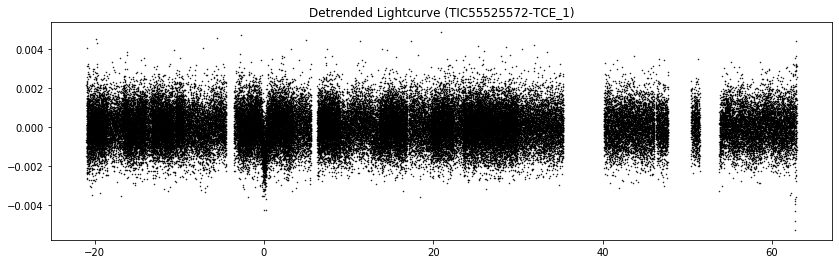

In [190]:
fig, ax = plt.subplots(figsize=(14,4))

# plotting the phased light curve
ax.plot(weird_lightcurve["PHASE"], weird_lightcurve['LC_DETREND'], 
        marker='.',linestyle='None', markersize=1, markerfacecolor='black', markeredgecolor="black") 
    
plt.title(f"Detrended Lightcurve (TIC{weird_tic_id}-{weird_tce})")            
plt.show(block=False)

In [191]:
bfig = plotting.figure(plot_width=850, plot_height=250, title=f"Detrended Lightcurve (TIC{weird_tic_id})")
bfig.circle(weird_lightcurve["PHASE"],weird_lightcurve["LC_DETREND"], fill_color="black",size=1, line_color=None)
plotting.show(bfig)

In [192]:
ra = metadata['DV Data Header']['RA_OBJ']
dec = metadata['DV Data Header']['DEC_OBJ']
obj_coord = SkyCoord(ra,dec,unit="deg")
print(obj_coord)

<SkyCoord (ICRS): (ra, dec) in deg
    (72.694091, -60.90545)>


In [193]:
Tesscut.get_sectors(obj_coord)

sectorName,sector,camera,ccd
str14,int64,int64,int64
tess-s0001-4-1,1,4,1
tess-s0002-4-1,2,4,1
tess-s0003-4-1,3,4,1
tess-s0004-4-2,4,4,2
tess-s0005-4-2,5,4,2
tess-s0006-4-2,6,4,2
tess-s0007-4-3,7,4,3
tess-s0008-4-3,8,4,3
tess-s0009-4-3,9,4,3


In [0]:
cutout_hdu = Tesscut.get_cutouts(obj_coord, size=50)[0]

In [195]:
cutout_hdu.info()

Filename: <class '_io.BytesIO'>
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      55   ()      
  1  PIXELS        1 BinTableHDU    279   1282R x 12C   [D, E, J, 2500J, 2500E, 2500E, 2500E, 2500E, J, E, E, 38A]   
  2  APERTURE      1 ImageHDU        79   (50, 50)   int32   


In [196]:
cutout_table = cutout_hdu[1].data
cutout_table.columns

ColDefs(
    name = 'TIME'; format = 'D'; unit = 'BJD - 2457000, days'; disp = 'D14.7'
    name = 'TIMECORR'; format = 'E'; unit = 'd'; disp = 'E14.7'
    name = 'CADENCENO'; format = 'J'; disp = 'I10'
    name = 'RAW_CNTS'; format = '2500J'; unit = 'count'; null = -1; disp = 'I8'; dim = '(50, 50)'
    name = 'FLUX'; format = '2500E'; unit = 'e-/s'; disp = 'E14.7'; dim = '(50, 50)'
    name = 'FLUX_ERR'; format = '2500E'; unit = 'e-/s'; disp = 'E14.7'; dim = '(50, 50)'
    name = 'FLUX_BKG'; format = '2500E'; unit = 'e-/s'; disp = 'E14.7'; dim = '(50, 50)'
    name = 'FLUX_BKG_ERR'; format = '2500E'; unit = 'e-/s'; disp = 'E14.7'; dim = '(50, 50)'
    name = 'QUALITY'; format = 'J'; disp = 'B16.16'
    name = 'POS_CORR1'; format = 'E'; unit = 'pixel'; disp = 'E14.7'
    name = 'POS_CORR2'; format = 'E'; unit = 'pixel'; disp = 'E14.7'
    name = 'FFI_FILE'; format = '38A'; unit = 'pixel'
)

In [197]:
bfig.circle(weird_lightcurve["TIME"],weird_lightcurve["LC_DETREND"], fill_color="black",size=1, line_color=None)
plotting.show(bfig)

In [0]:
def find_index(btjd):
    """
    Given a time as a Barycentric TESS Julian Date (BTJD) timestamp, return the closest index in a table
    that is assumed to have a TIME column that is also in BTJD"""
    
    return (np.abs(cutout_table['TIME'] - btjd)).argmin()

In [199]:
start = find_index(1331)
end = find_index(1333)

print(f"Frames {start}-{end} ({end-start} frames)")

Frames 272-368 (96 frames)


In [0]:
def make_animation(data_array, start_frame=0, end_frame=None, vmin=None, vmax=None, delay=50):
    """
    Function that takes an array where each frame is a 2D image array and make an animated plot
    that runs through the frames.
    
    Note: This can take a long time to run if you have a lot of frames.    
    Parameters
    ----------
    data_array : array
        Array of 2D images.
    start_frame : int
        The index of the initial frame to show. Default is the first frame.
    end_frame : int
        The index of the final frame to show. Default is the last frame.
    vmin : float
        Data range min for the colormap. Defaults to data minimum value.
    vmax : float
        Data range max for the colormap. Defaults to data maximum value.
    delay: 
        Delay before the next frame is shown in milliseconds.

    Returns
    -------
    response : `animation.FuncAnimation`
    """
    
    if not vmin:
        vmin = np.min(data_array)
    if not vmax:
        vmax = np.max(data_array)
        
    if not end_frame:
        end_frame = len(data_array) - 1 # set to the end of the array
        
    num_frames = end_frame - start_frame + 1 # include the end frame
        
    def animate(i, fig, ax, binarytab, start=0):
        """Function used to update the animation"""
        ax.set_title("Epoch #" + str(i+start))
        im = ax.imshow(binarytab[i+start], cmap=plt.cm.YlGnBu_r, vmin=vmin, vmax=vmax)
        return im,
    
    # Create initial plot.
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(data_array[start_frame], cmap=plt.cm.YlGnBu_r, vmin=vmin, vmax=vmax)

    ani = animation.FuncAnimation(fig, animate, fargs=(fig, ax, data_array, start_frame), frames=num_frames, 
                                  interval=delay, repeat_delay=1000)
    
    plt.close()
    
    return ani

In [201]:
make_animation(cutout_table['FLUX'], start, end, vmax=500)